<h1 style="text-align: center;">Credit Score Classification</h1>


`Use Case` : The credit score classification model is designed to predict an individual's creditworthiness by analyzing a range of financial and credit-related features. By leveraging historical data on financial behavior, payment history, and other relevant factors, the model provides a credit score prediction that helps financial institutions, such as banks, credit unions, and lending agencies, assess the potential risk of lending. This predictive tool enhances decision-making, reduces default risks, and streamlines the credit approval process, enabling institutions to make data-driven decisions when extending credit to individuals.

---

`Description of Features` :
1. **Annual Income**: The individual’s total income earned annually.
2. **Monthly Inhand Salary**: The individual’s take-home salary after all deductions on a monthly basis.
3. **Number of Bank Accounts**: The total number of bank accounts owned by the individual.
4. **Number of Credit Cards**: The total number of credit cards held by the individual.
5. **Interest Rate**: The interest rate applicable to any loans or credit cards held by the individual.
6. **Number of Loans**: The total number of loans taken out by the individual.
7. **Delay from Due Date**: The number of days by which the individual's payments have been delayed past the due date.
8. **Number of Delayed Payments**: The total number of times the individual has made payments after the due date.
9. **Changed Credit Limit**: Any changes in the individual’s credit limit over time, either increases or decreases.
10. **Number of Credit Inquiries**: The total number of times a lender has accessed the individual's credit report for review.
11. **Outstanding Debt**: The total amount of unpaid debt owed by the individual.
12. **Credit Utilization Ratio**: The ratio of credit currently being used by the individual compared to their total available credit.
13. **Credit History Age in Months**: The duration of the individual’s credit history, measured in months.
14. **Total EMI per Month**: The total amount paid by the individual each month as Equated Monthly Installments (EMIs) for loans or credit cards.
15. **Amount Invested Monthly**: The total amount of money the individual invests monthly in various financial products.
16. **Monthly Balance**: The individual’s remaining balance in bank accounts at the end of each month.
17. **Payment of Minimum Amount (Encoded)**: Encoded data indicating whether the individual consistently pays the minimum required amount on their credit bills.
18. **Payment Behaviour (Encoded)**: Encoded data representing the individual's overall payment behavior, such as timeliness and consistency.
19. **Credit Mix (Encoded)**: Encoded data showing the variety of credit products (e.g., loans, credit cards) used by the individual.

---
`Prediction Errors` :
1. **False Negative**: A false negative occurs when the model incorrectly classifies an individual with a 'Good' credit score as having a 'Bad' credit score. This results in the denial of credit to individuals who are actually creditworthy, causing the lending institution to miss out on potential profitable customers and business opportunities.
   
2. **False Positive**: A false positive happens when the model incorrectly classifies an individual with a 'Bad' credit score as having a 'Good' credit score. This leads to credit approval for high-risk individuals, increasing the possibility of default and financial losses for the lending institution.

Both types of errors carry significant risks for lending institutions. Striking a balance between false positives and false negatives is crucial to making sound lending decisions that optimize business growth while minimizing financial risks.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from imblearn.over_sampling import SMOTE
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
import utils

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [2]:
# Load the CSV file into a DataFrame
df = pd.read_csv('./preprocessed_data.csv')
# Set display options to show all rows and columns in the output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_in_months,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Occupation_Accountant,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Payment_Behaviour_High spent Large value payments,Payment_Behaviour_High spent Medium value payments,Payment_Behaviour_High spent Small value payments,Payment_Behaviour_Low spent Large value payments,Payment_Behaviour_Low spent Medium value payments,Payment_Behaviour_Low spent Small value payments,Credit_Mix_Bad,Credit_Mix_Good,Credit_Mix_Standard
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.1,809.98,35.030402,273.0,0.0,49.574949,236.642682,186.266702,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0
1,24.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,9.0,13.27,4.0,809.98,33.053114,274.0,0.0,49.574949,21.465380,361.444004,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
2,24.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,23.6,4.0,12.27,4.0,809.98,33.811894,208.8,0.0,49.574949,148.233938,264.675446,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
3,36.4,19114.12,1456.462500,3.0,4.0,3.0,4.0,4.0,5.0,11.27,4.0,809.98,32.430559,276.0,0.0,49.574949,39.082511,343.826873,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
4,28.0,34847.84,3037.986667,2.0,4.0,6.0,1.0,3.0,3.0,5.42,5.0,605.03,30.116600,328.0,0.0,18.816215,251.627369,303.355083,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0


# Splitting the data 

In [3]:
# Define the categorical columns made from Credit_Mix column
credit_mix_columns = ['Credit_Mix_Bad', 'Credit_Mix_Good', 'Credit_Mix_Standard']


# This separates the features (input data) from the dataframe
features = df.drop(credit_mix_columns, axis=1)

# The target (output) labels consist of the three Credit Mix categories
labels = df[credit_mix_columns]

In [4]:
# Define the mapping for encoded labels back to the original values
label_mapping = {
    'Credit_Mix_Good': 'Good',
    'Credit_Mix_Standard': 'Standard',
    'Credit_Mix_Bad': 'Bad'
}

# Convert the encoded labels back to single labels
labels = df[credit_mix_columns].idxmax(axis=1).map(label_mapping)

labels.head()

0    Good
1    Good
2    Good
3    Good
4    Good
dtype: object

In [5]:
# Split the original dataset into training (80%) and temporary (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(features, labels,
                                                    test_size=0.2, random_state=42)

# Then split the tempporary (20%) set into testing (10%) and validation (10%) sets
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp,
                                                test_size=0.5, random_state=42)

# SMOTE(Synthetic Minority Oversampling Technique)
SMOTE is used to address class imbalance by generating synthetic examples for the minority class, reducing bias in the model towards the majority class. It helps improve classification performance, particularly for minority classes, by creating a more balanced dataset without overfitting common in random oversampling.

SMOTE should only be applied to the training set because oversampling artificially alters the class distribution. Applying it to validation or test sets can lead to misleading performance metrics by inflating model accuracy with synthetic data and would interfere with the evaluation of the model's performance on real, unseen data.

In [6]:
# Apply SMOTE to balance the dataset
X_train_resampled, y_train_resampled = SMOTE(random_state=42, k_neighbors=10).fit_resample(X_train, y_train)

# Count the occurrences of each class before SMOTE
class_counts = pd.Series(y_train).value_counts()
print(f"Class counts before SMOTE: \n{class_counts}")

# Count the occurrences of each class after SMOTE
class_counts = pd.Series(y_train_resampled).value_counts()
print(f"Class counts after SMOTE: \n{class_counts}")

Class counts before SMOTE: 
Standard    11768
Good         7816
Bad          6216
dtype: int64
Class counts after SMOTE: 
Good        11768
Bad         11768
Standard    11768
dtype: int64


In [7]:
# Create a dictionary with dataset names and their shapes
data_shapes = {
    'Dataset': ['X_train', 'X_val', 'X_test', 'y_train', 'y_val', 'y_test'],
    'Shape': [X_train_resampled.shape, X_val.shape, X_test.shape, y_train_resampled.shape, y_val.shape, y_test.shape]
}

# Create a DataFrame to display the shapes
df_shapes = pd.DataFrame(data_shapes)

# Display the DataFrame
df_shapes

,Dataset,Shape
0,X_train,"(35304, 38)"
1,X_val,"(3226, 38)"
2,X_test,"(3225, 38)"
3,y_train,"(35304,)"
4,y_val,"(3226,)"
5,y_test,"(3225,)"


# Decision Trees

In [8]:
# Define the parameter grid
param_grid_1 = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'min_samples_leaf': [1, 2, 3, 4],
    'min_samples_split': [2, 4, 6, 8, 10],
    'min_impurity_decrease': [0.0, 0.01, 0.05],
    'class_weight': ['balanced', None]
}

# Initialize GridSearchCV
clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(clf, param_grid_1, cv=5, scoring='accuracy')

# Fit GridSearchCV on the training data
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

/Users/simranpreetsingh/anaconda3/envs/practice_python/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
4800 fits failed out of a total of 19200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4800 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/simranpreetsingh/anaconda3/envs/practice_python/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/simranpreetsingh/anaconda3/envs/practice_python/lib/python3.10/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/Users/simranpreetsingh/anaconda3/envs/practice_

Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 4}
Best Score: 0.9526402418744304


# Decision Tree model with best parameters

In [9]:
best_model = DecisionTreeClassifier(criterion='entropy', max_depth=None, 
                                    max_features=None, min_impurity_decrease=0.0, 
                                    min_samples_leaf=1, min_samples_split=4,
                                    class_weight = None,
                                    random_state=42)

# Fit the new classifier on the training data
best_model.fit(X_train_resampled, y_train_resampled)

DecisionTreeClassifier(criterion='entropy', min_samples_split=4,
                       random_state=42)

                      Training Dataset                      

Classification Report (Training):

              precision    recall  f1-score   support

        Good       1.00      1.00      1.00     11768
    Standard       1.00      1.00      1.00     11768
         Bad       1.00      1.00      1.00     11768

    accuracy                           1.00     35304
   macro avg       1.00      1.00      1.00     35304
weighted avg       1.00      1.00      1.00     35304


Confusion Matrix (Training):



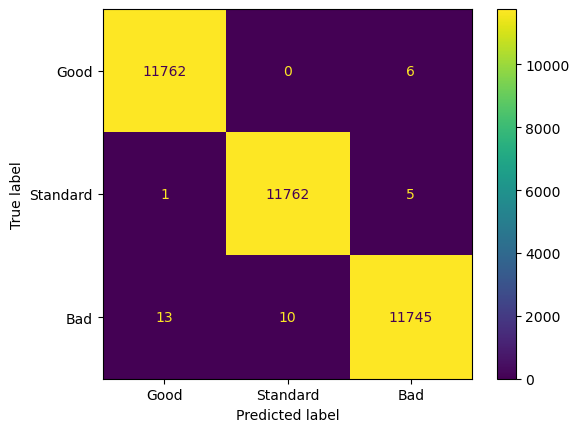

                     Validation Dataset                     

Classification Report (Validation):

              precision    recall  f1-score   support

        Good       0.95      0.95      0.95       767
    Standard       0.94      0.95      0.94      1008
         Bad       0.94      0.93      0.93      1451

    accuracy                           0.94      3226
   macro avg       0.94      0.94      0.94      3226
weighted avg       0.94      0.94      0.94      3226


Confusion Matrix (Validation):



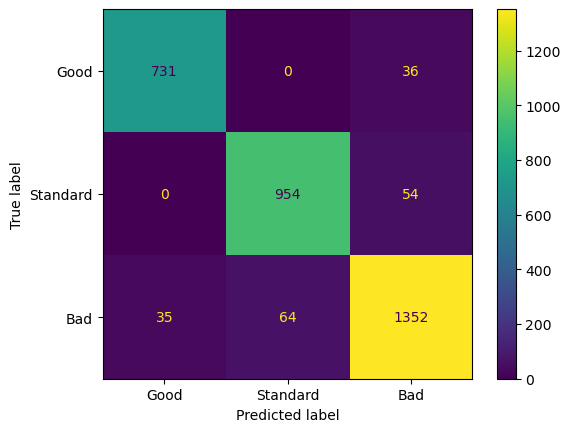



Training Accuracy   : 0.9990086109222751
Validation Accuracy : 0.9414135151890887


In [10]:
def evaluate_model(model, X_train, y_train, X_val, y_val, labels):
    """
    This function evaluates the model on both training and validation data.
    It displays the classification report, confusion matrix, and accuracy for each dataset.
    
    Parameters:
    - model: The trained model to evaluate.
    - X_train, X_val: Feature sets for training and validation.
    - y_train, y_val: True labels for training and validation (in categorical format).
    - labels: List of class labels (e.g., ['Good', 'Standard', 'Bad']).
    """

    # Predict on training and validation data
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    
    # Training Classification Report and Confusion Matrix
    print("Training Dataset".center(60))
    print("\nClassification Report (Training):\n")
    print(classification_report(y_train, y_train_pred, target_names=labels))
    
    print("\nConfusion Matrix (Training):\n")
    ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred, display_labels=labels)
    plt.show()

    # Validation Classification Report and Confusion Matrix
    print("Validation Dataset".center(60))
    print("\nClassification Report (Validation):\n")
    print(classification_report(y_val, y_val_pred, target_names=labels))
    
    print("\nConfusion Matrix (Validation):\n")
    ConfusionMatrixDisplay.from_predictions(y_val, y_val_pred, display_labels=labels)
    plt.show()

    # Calculate and print accuracies
    train_accuracy = accuracy_score(y_train, y_train_pred)
    val_accuracy = accuracy_score(y_val, y_val_pred)
    
    print(f"\n\nTraining Accuracy   : {train_accuracy}")
    print(f"Validation Accuracy : {val_accuracy}")

# List of labels
labels = ['Good', 'Standard', 'Bad']

# Call the function to evaluate the model
evaluate_model(best_model, X_train_resampled, y_train_resampled, X_val, y_val, labels)

                        Test Dataset                        

Classification Report (Test):

              precision    recall  f1-score   support

        Good       0.94      0.96      0.95       769
    Standard       0.95      0.95      0.95       966
         Bad       0.95      0.93      0.94      1490

    accuracy                           0.95      3225
   macro avg       0.94      0.95      0.95      3225
weighted avg       0.95      0.95      0.95      3225


Confusion Matrix (Test):



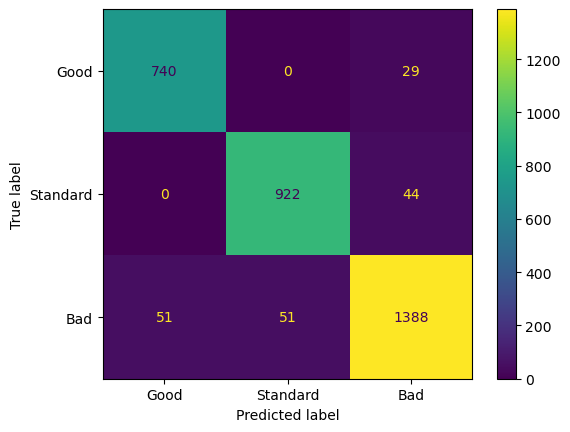



Test Accuracy   : 0.9457364341085271


In [11]:
def evaluate_model_on_test(model, X_test, y_test, labels):
    """
    This function evaluates the model on the test data.
    It displays the classification report, confusion matrix, and 
    accuracy for the test dataset.
    
    Parameters:
    - model: The trained model to evaluate.
    - X_test: Feature set for testing.
    - y_test: True labels for testing (in categorical format).
    - labels: List of class labels (e.g., ['Good', 'Standard', 'Bad']).
    """
    
    # Predict on the test data
    y_test_pred = model.predict(X_test)
    
    # Test Classification Report and Confusion Matrix
    print("Test Dataset".center(60))
    print("\nClassification Report (Test):\n")
    print(classification_report(y_test, y_test_pred, target_names=labels))
    
    print("\nConfusion Matrix (Test):\n")
    ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred, display_labels=labels)
    plt.show()

    # Calculate and print test accuracy
    test_accuracy = accuracy_score(y_test, y_test_pred)
    print(f"\n\nTest Accuracy   : {test_accuracy}")

    
# Call the function to evaluate the model on test data
evaluate_model_on_test(best_model, X_test, y_test, labels)

# Metrics Assessment

`Precision` and `Recall`: The model demonstrates consistently high precision and recall across all classes, suggesting that it has been trained effectively. This is particularly crucial for credit scoring, as accurate classification minimizes the risk of financial misjudgments, such as granting credit to high-risk customers or rejecting low-risk ones.

`F1-score`: The F1-score, which strikes a balance between precision and recall, is robust across all classes. This indicates a well-calibrated model that maintains a strong equilibrium between minimizing false positives and false negatives, which is vital for building a reliable credit scoring system.

`Confusion Matrix`: The confusion matrix highlights that the model accurately classifies the majority of cases within each class. Furthermore, the distribution of misclassifications is fairly even across different classes, suggesting that the model does not exhibit significant bias towards any particular class.

`Accuracy`: The model achieves a high overall accuracy of **94.57%**, signifying that it performs effectively across all classes and is capable of making correct predictions in the vast majority of cases.

In [12]:
utils.display_tree(best_model)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.819954 to fit

